In [2]:
import pandas as pd
from pandas import read_csv
import numpy as np
import datetime


from matplotlib import pyplot as plt


In [3]:
Sensors = pd.read_csv("./appa1_timeline.csv",
                     sep = ",")
Sensors.set_index("channel", inplace = True)
Sensors = Sensors.applymap(lambda x: x.replace("*", ""))

dfSC = read_csv("./StChiara_hourly.csv",
             sep = ",",
             parse_dates = ["ts"])
dfSC.set_index("ts", inplace = True)

change = {}
for i in range(1,9):
    change["S" +str(i)+"_R1"] = "T" + str(i)
    change["S" +str(i)+"_R2"] = "R" + str(i)
    change["S"+ str(i)+"_Voltage"] = "V"+str(i)
dfSC = dfSC.rename(columns=change)

In [4]:
Test = {}
maxim = len(Sensors.columns)
for i,col in enumerate(Sensors.columns):
    materials = []
    if i == maxim-1:
        for j,material in enumerate(Sensors[col]):
            f = materials.count(material)+1            
            materials.append(material)
            if list(Test.keys()).count(material + str(f)) == 1:
                Test[material + str(f)] = pd.concat([Test[material + str(f)],
                                                     dfSC[col:][["R"+str(j+1),
                                                                   "T"+str(j+1),
                                                                   "V"+str(j+1)]].rename(columns = {
                                                         "R"+str(j+1):"R",
                                                         "T"+str(j+1):"HT",
                                                         "V"+str(j+1):"V"
                                                     })])
            else:
                Test[material + str(f)] = dfSC[col:][["R"+str(j+1),
                                                                   "T"+str(j+1),
                                                                   "V"+str(j+1)]].rename(columns = {
                                                         "R"+str(j+1):"R",
                                                         "T"+str(j+1):"HT",
                                                         "V"+str(j+1):"V"
                                                     })    
    else:
        for j,material in enumerate(Sensors[col]):
            f = materials.count(material)+1            
            materials.append(material)
            if list(Test.keys()).count(material + str(f)) == 1:
                Test[material + str(f)] = pd.concat([Test[material + str(f)],
                                                     dfSC[col:Sensors.columns[i+1]][["R"+str(j+1),
                                                                   "T"+str(j+1),
                                                                   "V"+str(j+1)]].rename(columns = {
                                                         "R"+str(j+1):"R",
                                                         "T"+str(j+1):"HT",
                                                         "V"+str(j+1):"V"
                                                     })
                                                    ])
            else:
                Test[material + str(f)] = dfSC[col:Sensors.columns[i+1]][["R"+str(j+1),
                                                                   "T"+str(j+1),
                                                                   "V"+str(j+1)]].rename(columns = {
                                                         "R"+str(j+1):"R",
                                                         "T"+str(j+1):"HT",
                                                         "V"+str(j+1):"V"
                                                     })

In [5]:
Test # DICTIONARY {SENSORS, DATAFRAME}

{'ZnOR1':                                        R         HT         V
 ts                                                           
 2021-01-13 00:00:00+00:00            NaN        NaN       NaN
 2021-01-13 01:00:00+00:00            NaN        NaN       NaN
 2021-01-13 02:00:00+00:00            NaN        NaN       NaN
 2021-01-13 03:00:00+00:00            NaN        NaN       NaN
 2021-01-13 04:00:00+00:00            NaN        NaN       NaN
 ...                                  ...        ...       ...
 2023-06-26 05:00:00+00:00  161625.094828  68.558621  1.990172
 2023-06-26 06:00:00+00:00  162563.966667  68.520000  1.989667
 2023-06-26 07:00:00+00:00  166067.916667  68.536667  1.989500
 2023-06-26 08:00:00+00:00  171913.950000  68.570000  1.990000
 2023-06-26 09:00:00+00:00  173276.166667  68.616667  1.990000
 
 [21658 rows x 3 columns],
 'ZnOR2':                                        R         HT         V
 ts                                                           
 2021-01

In [6]:
Sensors

,1/13/2021,4/29/2021,6/30/2021,1/14/2022,4/19/2022,6/30/2022,9/28/2022,2/8/2023,6/22/2023
channel,,,,,,,,,
1,ZnOR,ZnOR,LaFeO3,LaFeO3,LaFeO3,SnO2,SnO2,SnO2Au,SnO2Au
2,ZnOR,ZnOR,LaFeO3,LaFeO3,LaFeO3,LaFeO3,LaFeO3,SnO2Pt,SnO2Pt
3,LaFeO3,WO3,WO3,WO3,WO3,WO3,ZnOR,ZnOR,ZnOR
4,LaFeO3,WO3,WO3,WO3,WO3,WO3,ZnOR,ZnOR,ZnOR
5,WO3,LaFeO3,ZnOR,ZnOR,ZnOR,ZnOR,WO3,WO3,WO3
6,WO3,LaFeO3,ZnOR,ZnOR,ZnOR,ZnOR,WO3,WO3,WO3
7,ZnO,ZnOg,ZnOg,SmFeO3,SmFeO3,SmFeO3,SmFeO3,SmFeO3,SmFeO3
8,ZnO,ZnOg,STN,STN,STN,STN,STN,STN,STN


In [7]:
# dfSC = pd.read_csv(
#     "./StChiara.csv",
#     sep=",",
#     header=0,
#     parse_dates=["ts"],
# )

# dfSC = dfSC.set_index("ts").resample("1H").mean().reset_index()

# dfSC.to_csv("StChiara_hourly.csv", index=False)

In [8]:
dfSC = dfSC.apply(pd.to_numeric, errors='coerce')
dfSC = dfSC.dropna()

In [9]:
DF1 = Test["ZnOR1"]
DF2 = Test["ZnOR2"]
DF3 = Test["LaFeO31"]
DF4 = Test["LaFeO32"]
DF5 = Test["WO31"]
DF6 = Test["WO32"]
DF7 = Test["ZnO1"]
DF8 = Test["ZnO2"]

In [10]:
df_APPA = pd.read_csv(
    "./APPA1.csv",
    sep=",",
    header=0,
    parse_dates=["Time"],
)

df_APPA

,Time,PM10,Biossido di Azoto,Biossido Zolfo,Ozono,PM2.5
0,2020-01-01 01:00:00,71.0,48.0,5.0,4.0,59.0
1,2020-01-01 02:00:00,52.0,49.0,4.0,4.0,42.0
2,2020-01-01 03:00:00,51.0,52.0,5.0,4.0,43.0
3,2020-01-01 04:00:00,41.0,48.0,4.0,3.0,33.0
4,2020-01-01 05:00:00,35.0,48.0,3.0,3.0,27.0
...,...,...,...,...,...,...
33134,2022-03-04 14:00:00,NaN,NaN,NaN,75.0,41.0
33135,2022-06-21 14:00:00,NaN,NaN,NaN,143.0,NaN
33136,2022-09-02 11:00:00,NaN,NaN,NaN,61.0,NaN
33137,2023-02-01 13:00:00,NaN,NaN,NaN,32.0,NaN


In [11]:
dfSC.reset_index(inplace=True)

In [12]:
timezone_offset = datetime.timedelta(hours=2)
timezone = datetime.timezone(timezone_offset)
df_APPA.Time = df_APPA.Time.apply(lambda x: x.replace(tzinfo=timezone))


timezone_offset = datetime.timedelta(hours=0)
timezone = datetime.timezone(timezone_offset)
dfSC.ts = dfSC.ts.apply(lambda x: x.replace(tzinfo=timezone))
print(dfSC)

df_APPA.rename(columns = {"Time":"ts"}, inplace = True)

                             ts            R1            R2            R3  \
0     2019-08-26 16:00:00+00:00  8.050480e+04  1.957000e+03  1.178759e+08   
1     2019-08-27 07:00:00+00:00  7.720806e+04  1.971625e+03  1.195054e+08   
2     2019-08-27 13:00:00+00:00  1.271295e+07  1.310720e+08  4.990000e+08   
3     2019-08-27 14:00:00+00:00  3.639655e+07  1.310720e+08  4.990000e+08   
4     2019-08-27 15:00:00+00:00  1.706043e+07  3.910342e+07  1.454772e+08   
...                         ...           ...           ...           ...   
26072 2023-06-26 05:00:00+00:00  4.073563e+07  1.280000e+08  1.616251e+05   
26073 2023-06-26 06:00:00+00:00  3.822222e+07  1.280000e+08  1.625640e+05   
26074 2023-06-26 07:00:00+00:00  3.360000e+07  1.280000e+08  1.660679e+05   
26075 2023-06-26 08:00:00+00:00  3.235556e+07  1.280000e+08  1.719140e+05   
26076 2023-06-26 09:00:00+00:00  3.288889e+07  1.280000e+08  1.732762e+05   

                 R4            R5            R6            R7            R8

In [13]:
df_tot = dfSC.merge(df_APPA)

In [14]:
df_tot = df_tot.apply(pd.to_numeric, errors='coerce')

In [15]:
df_tot.ts = pd.to_datetime(df_tot.ts)

In [16]:
df_tot = df_tot.set_index("ts")

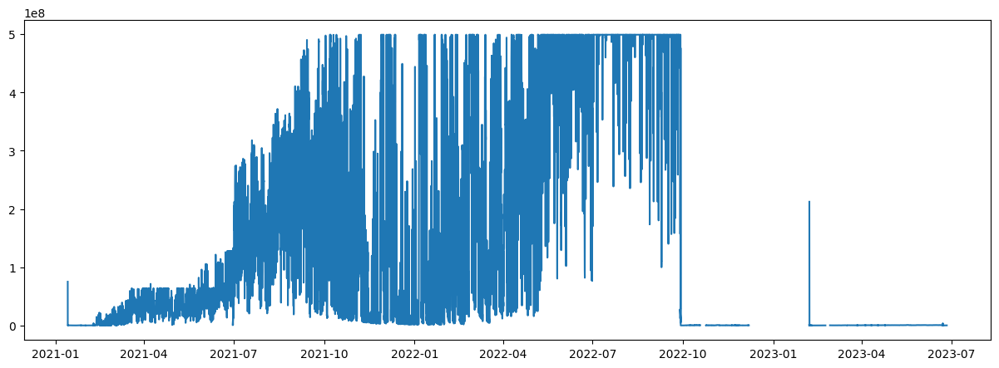

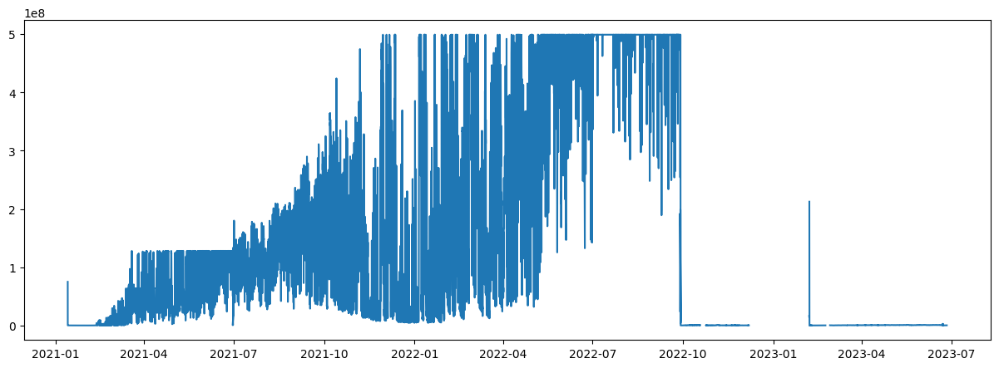

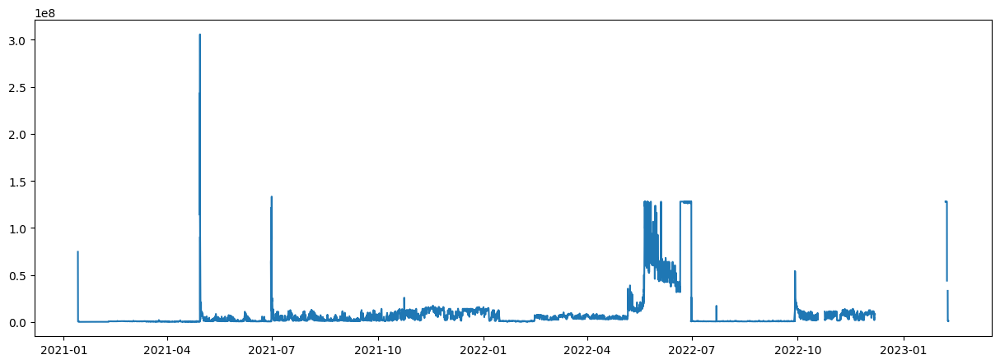

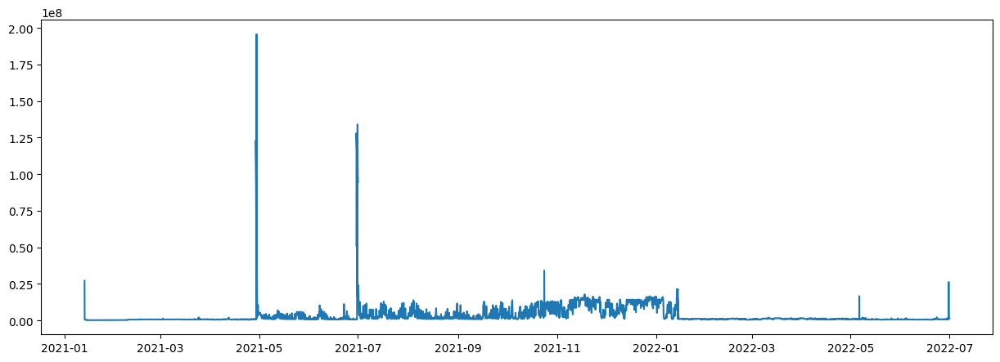

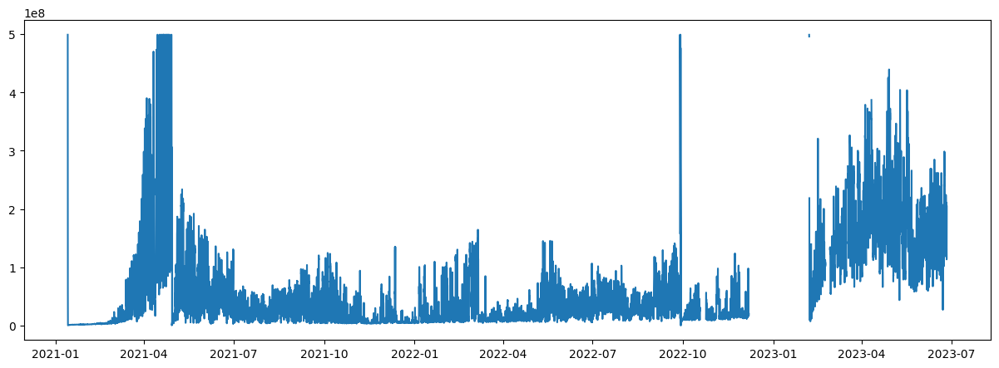

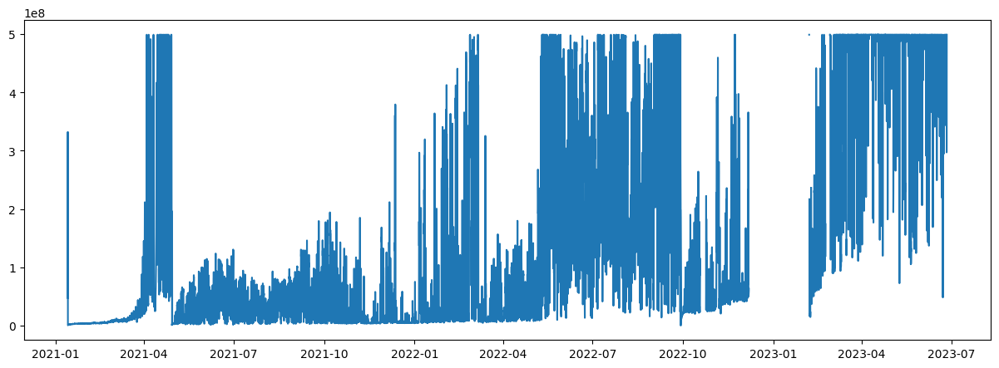

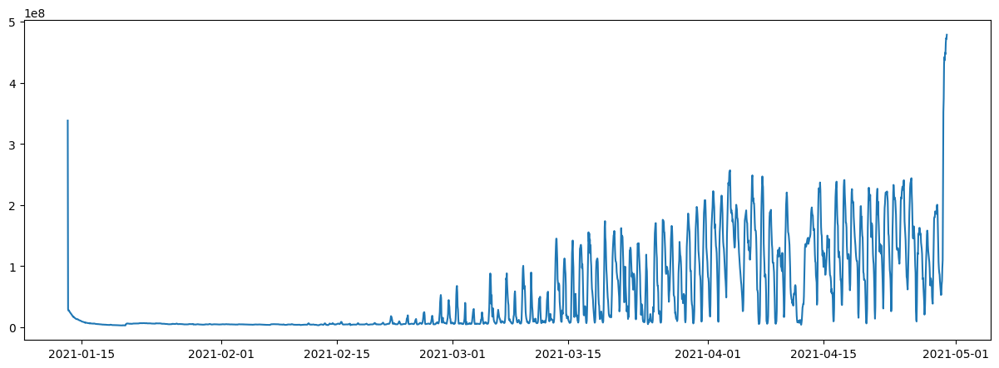

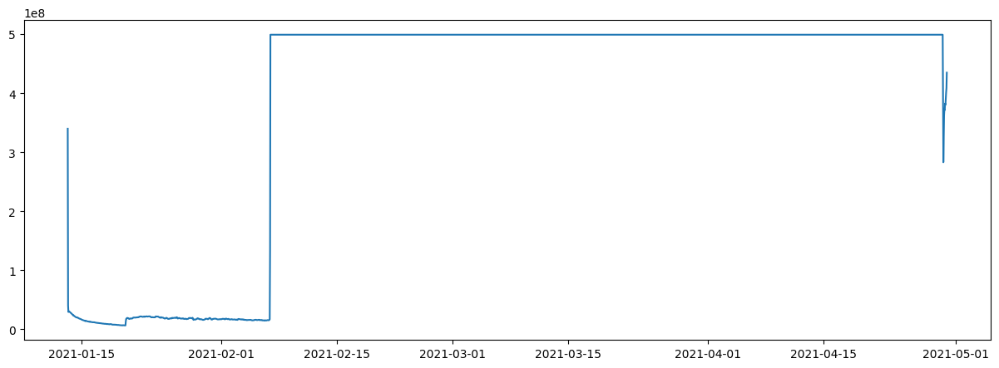

In [17]:
# CHART TIME-RESISTANCE

DF = [DF1, DF2, DF3, DF4, DF5, DF6, DF7, DF8]
for i in DF:
    fig = plt.figure(figsize=(15,5))
    plt.plot(
        i.index,
        i.R
    )
    plt.show()
    

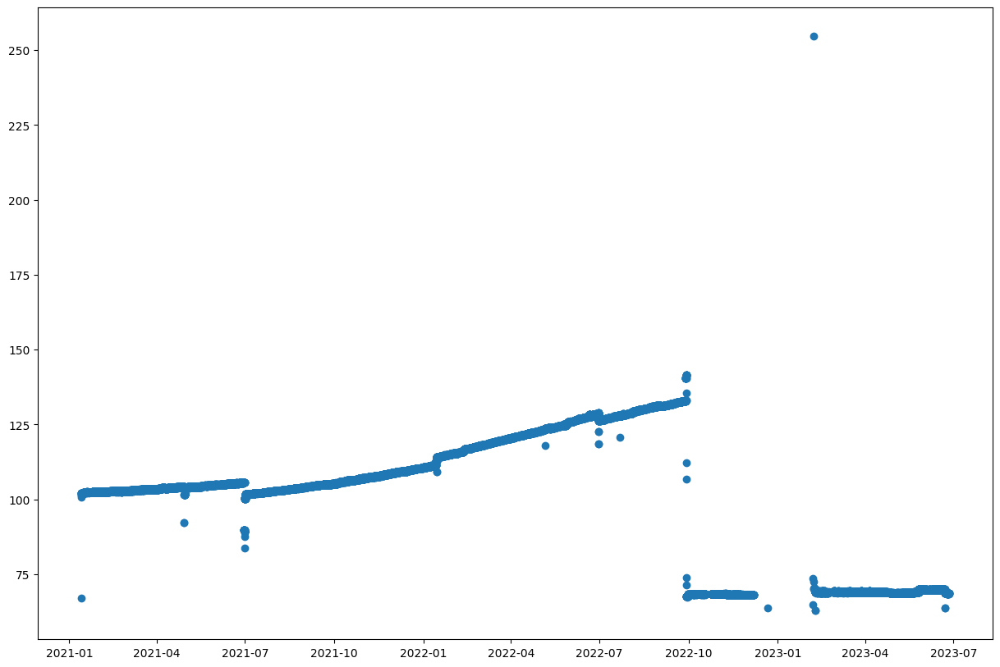

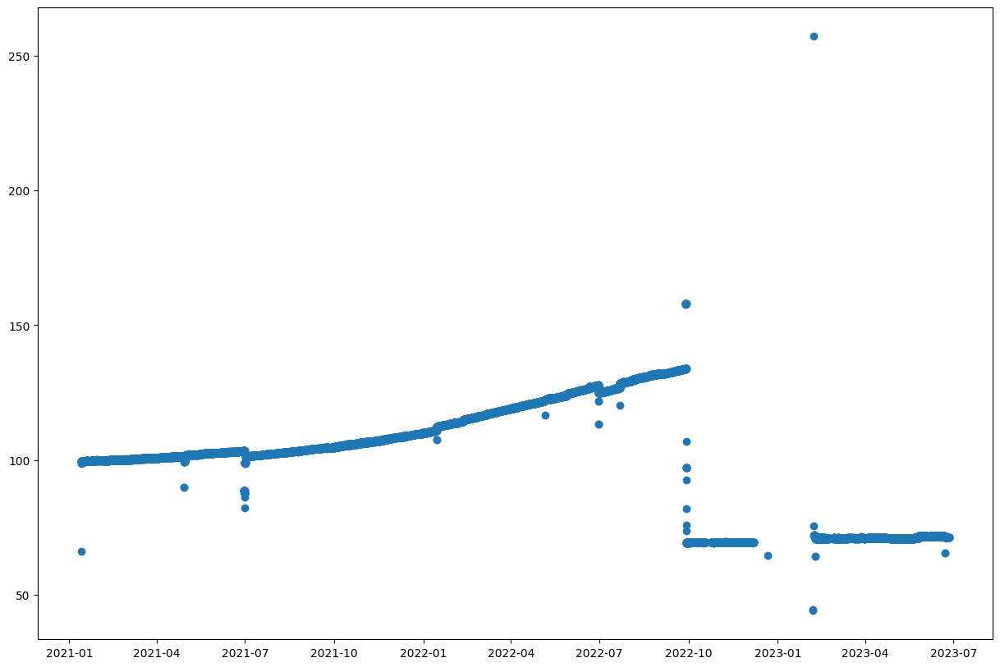

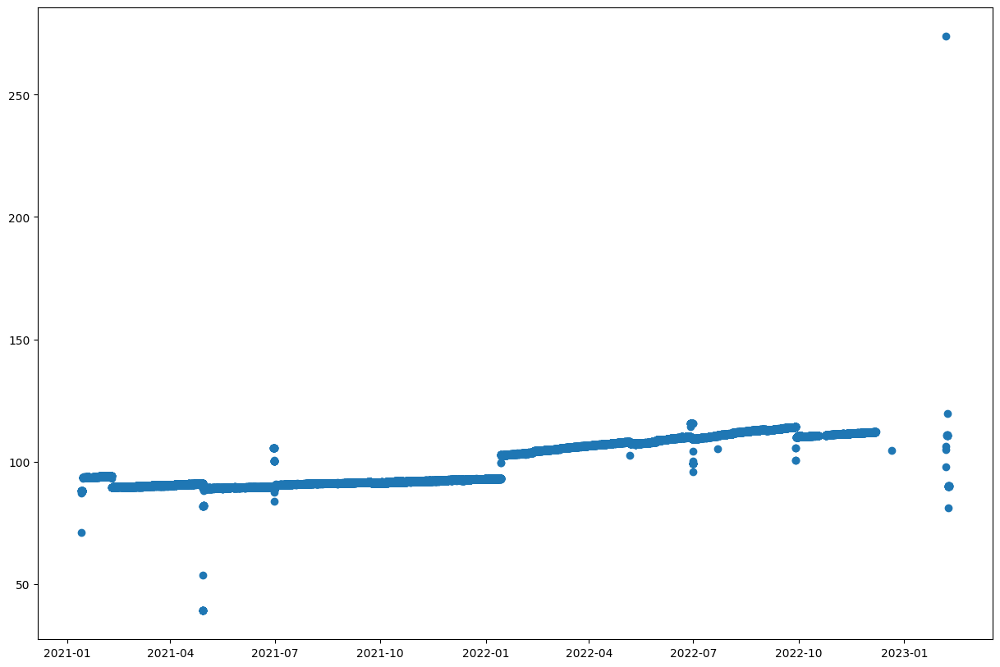

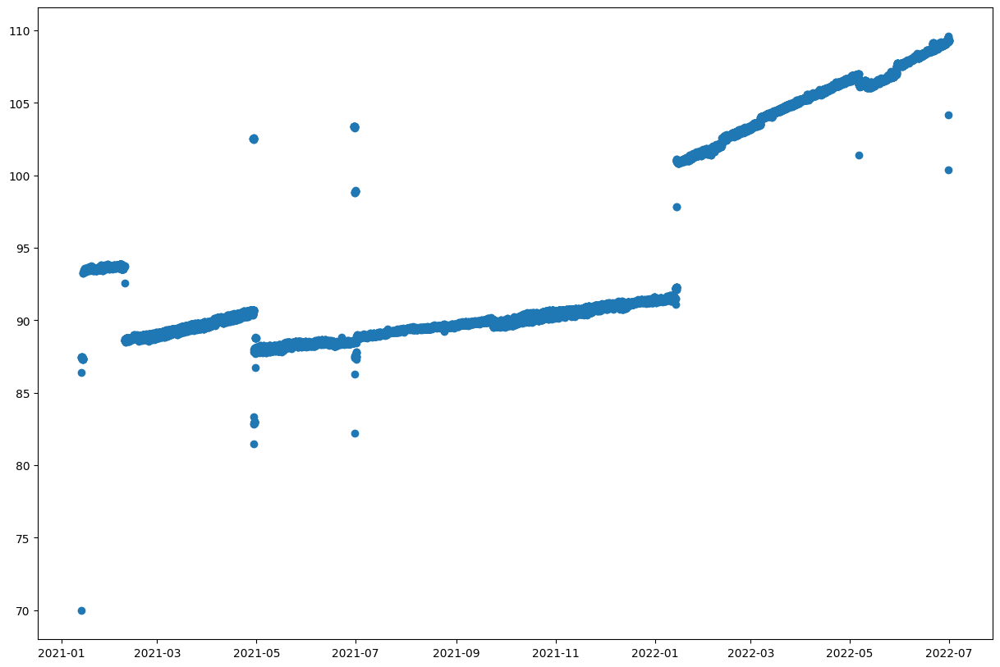

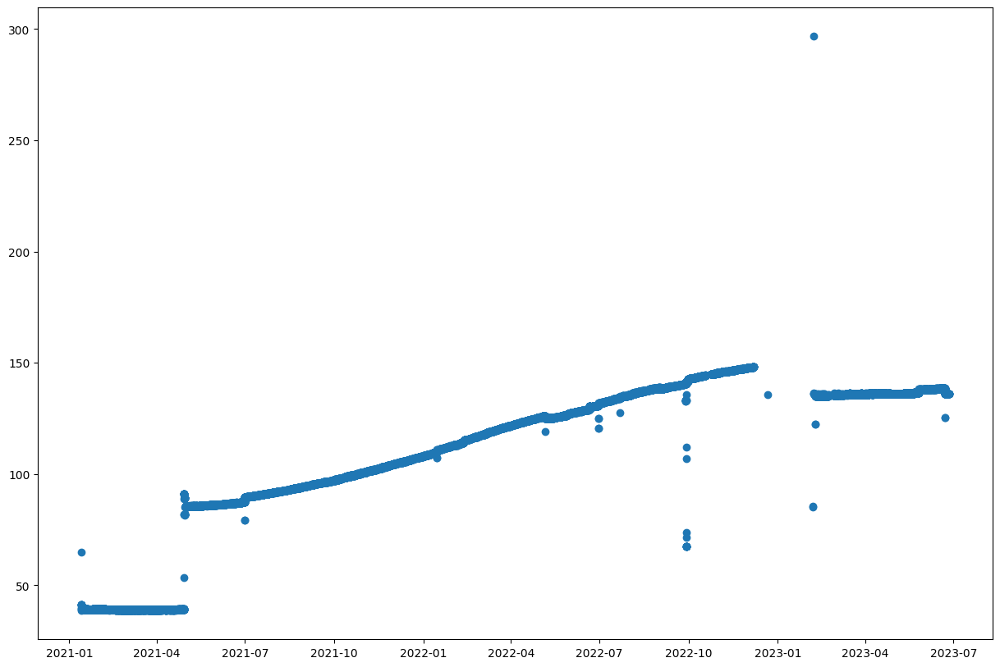

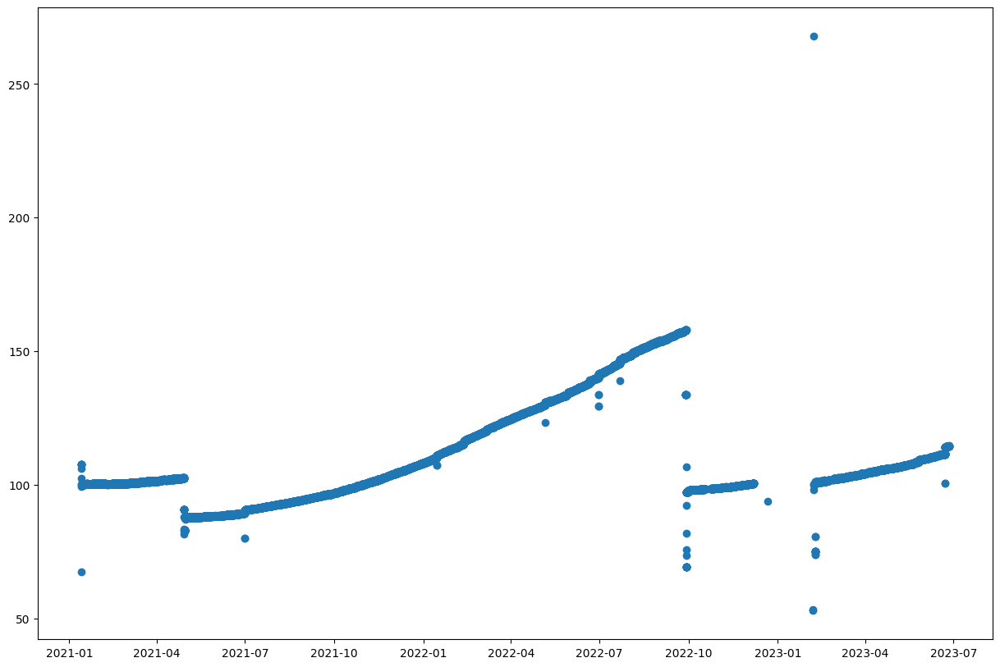

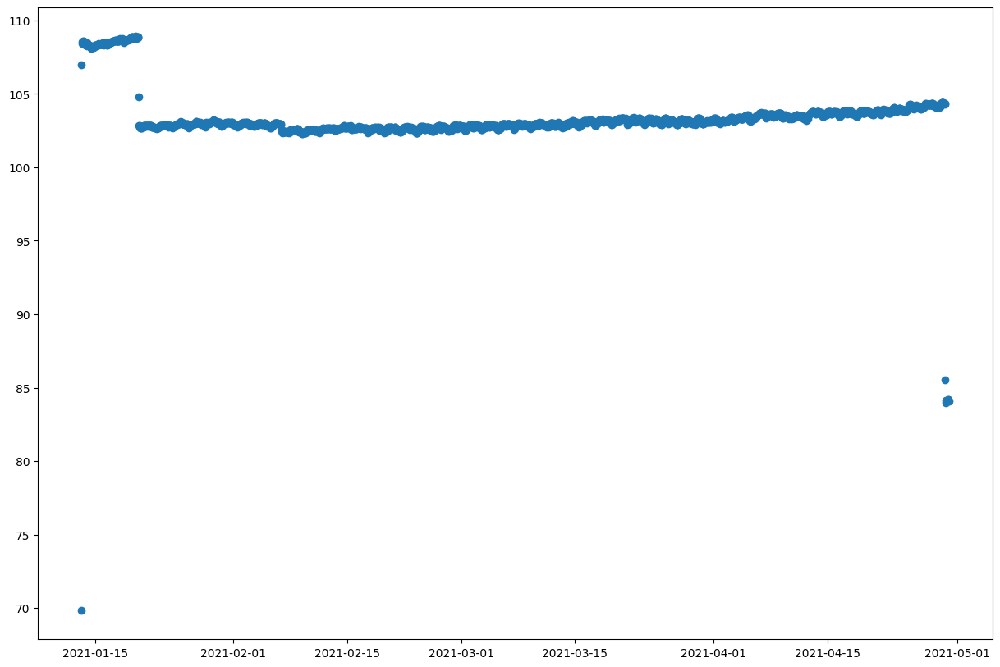

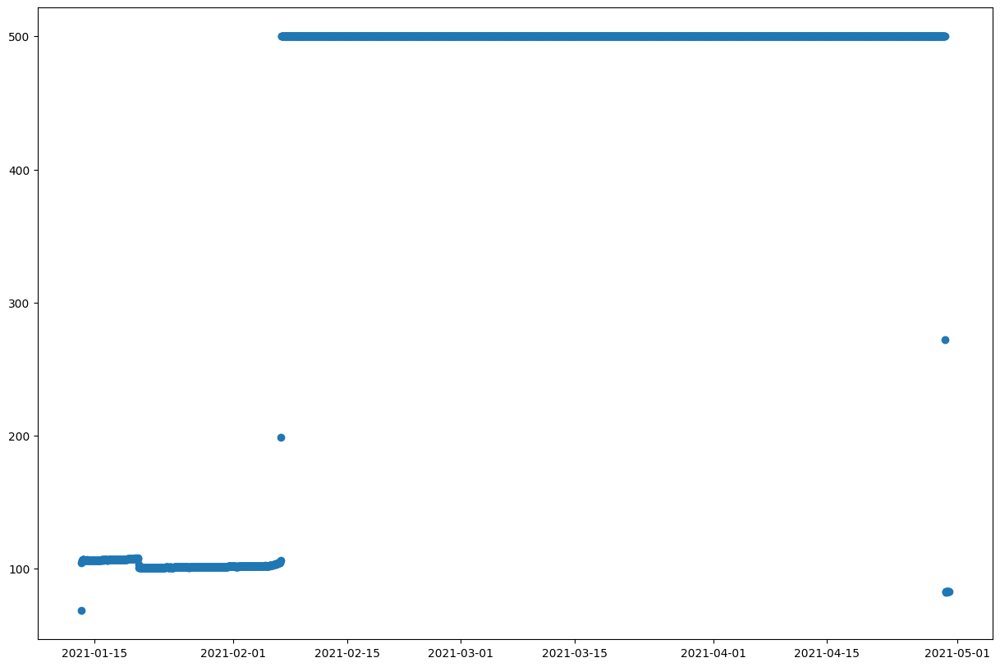

In [18]:
# CHART TIME-TEMPERATURE

DF = [DF1, DF2, DF3, DF4, DF5, DF6, DF7, DF8]
for i in DF:
    fig = plt.figure(figsize=(15,10))
    plt.scatter(
        i.index,
        i.HT
    )
    plt.show()

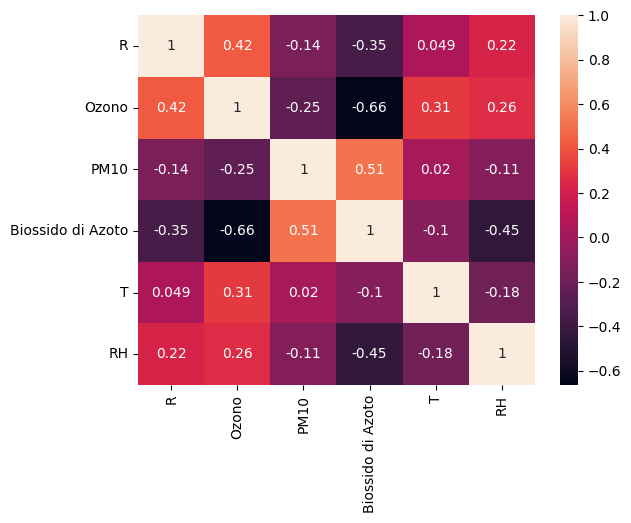

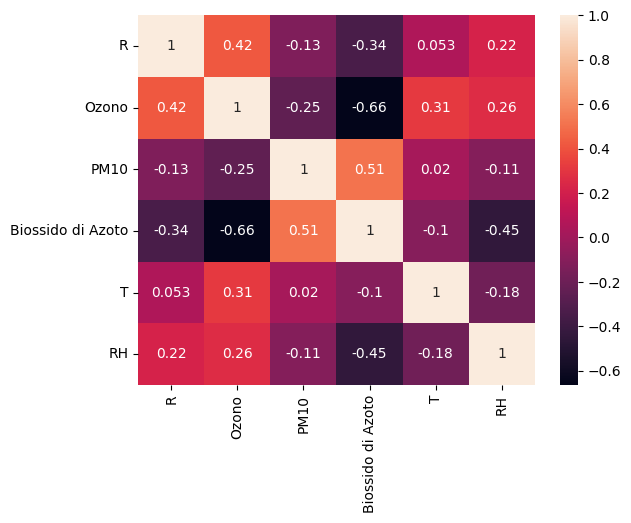

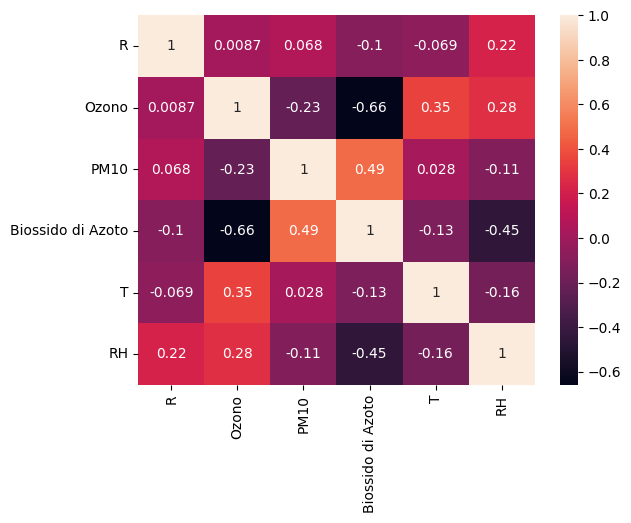

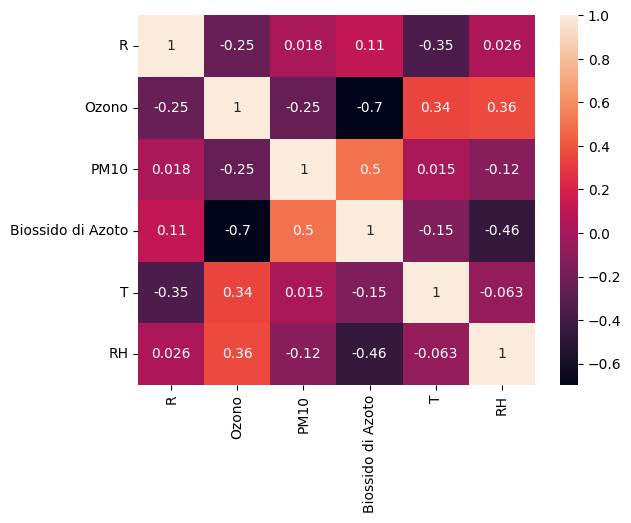

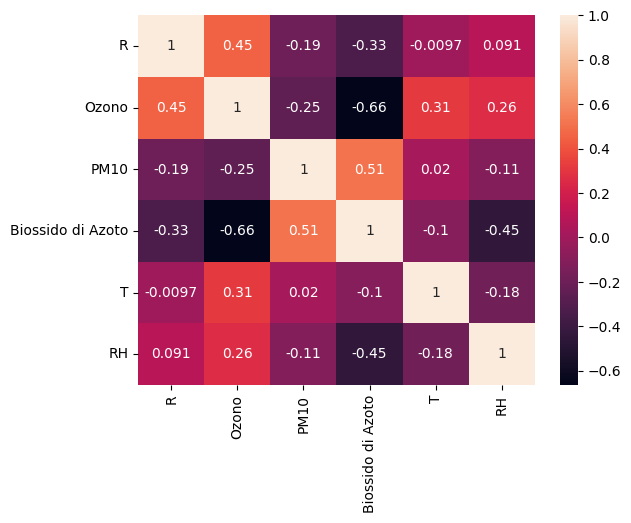

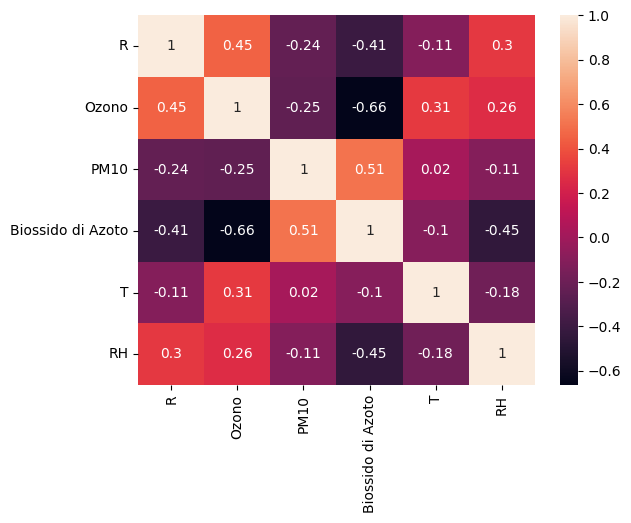

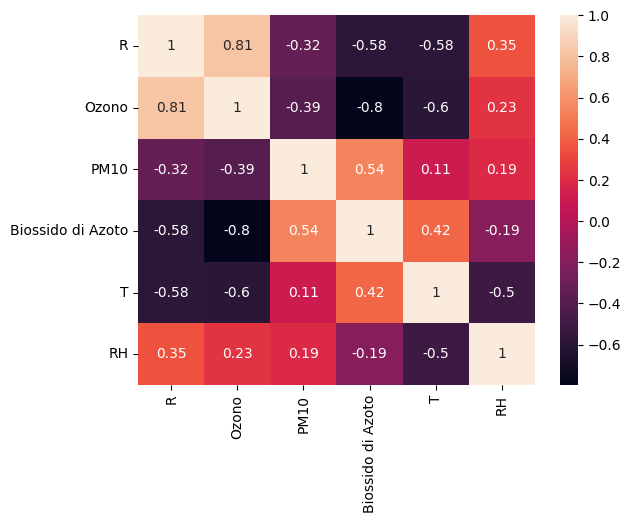

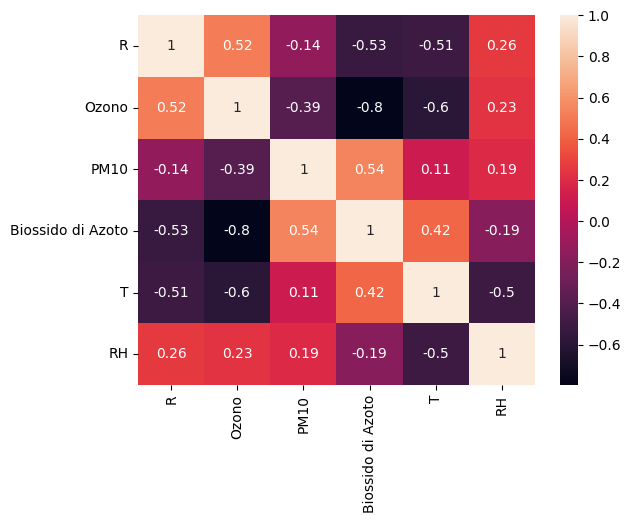

In [19]:
import seaborn as sns
DF = [DF1, DF2, DF3, DF4, DF5, DF6, DF7, DF8]

df_tot.reset_index(inplace = True)

timezone_offset = datetime.timedelta(hours=0)
timezone = datetime.timezone(timezone_offset)
df_tot.ts = df_tot.ts.apply(lambda x: x.replace(tzinfo=timezone))

for i in DF:
    correlation = df_tot.merge(i.reset_index())[["R","Ozono","PM10", "Biossido di Azoto","T","RH"]].corr()
    # correlation.style.background_gradient(cmap='coolwarm')
    sns.heatmap(correlation, annot=True)
    plt.show()

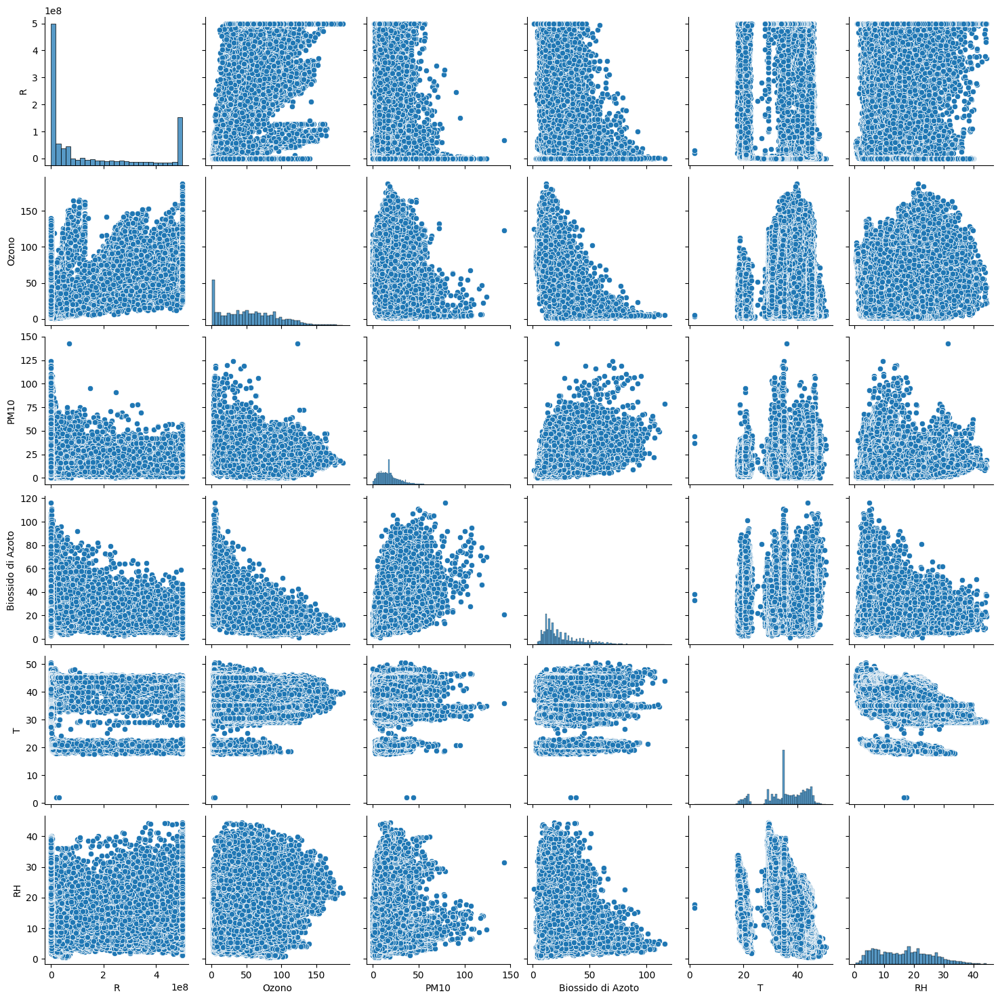

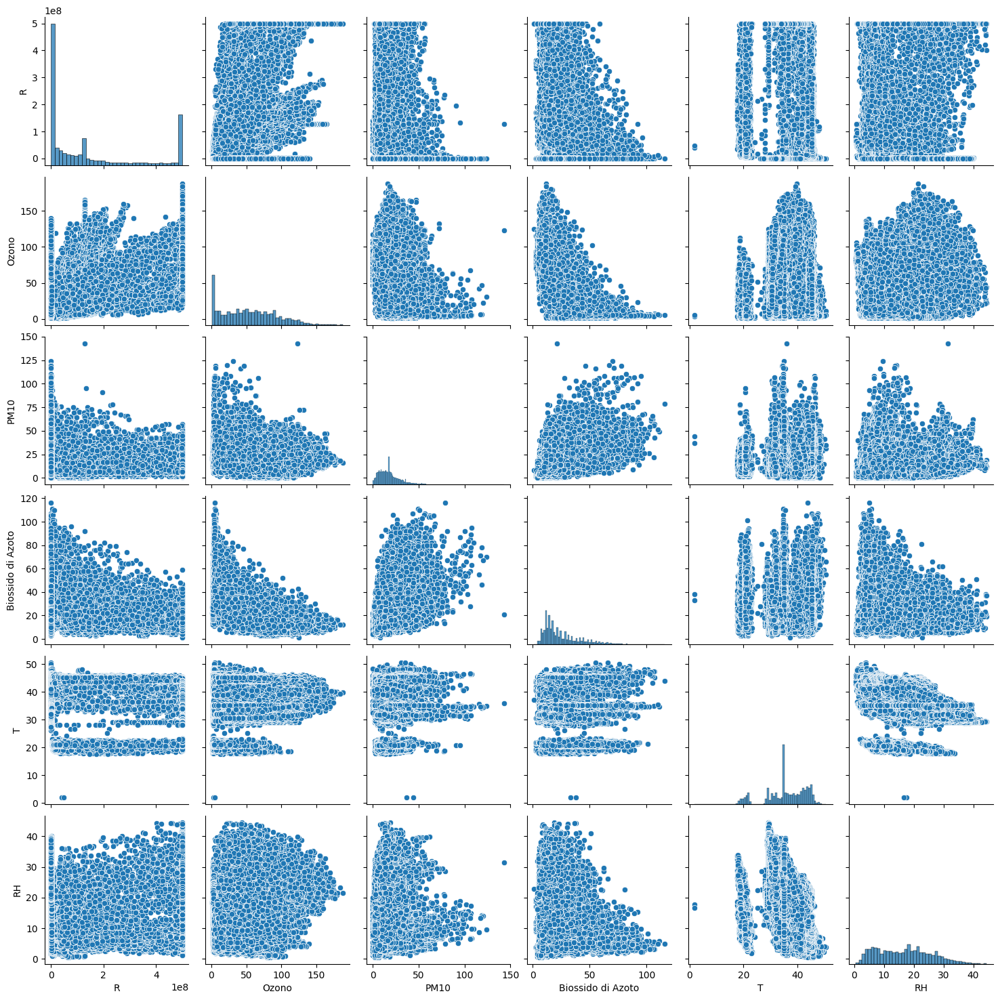

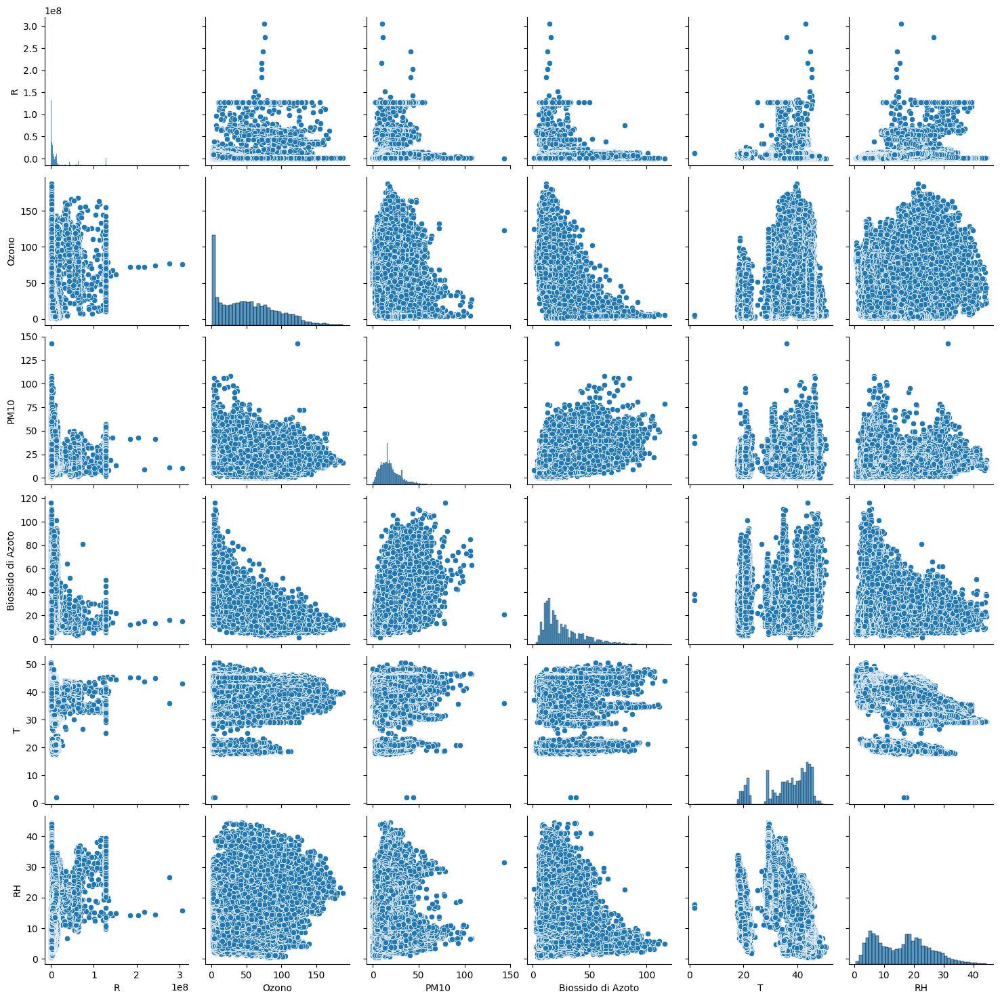

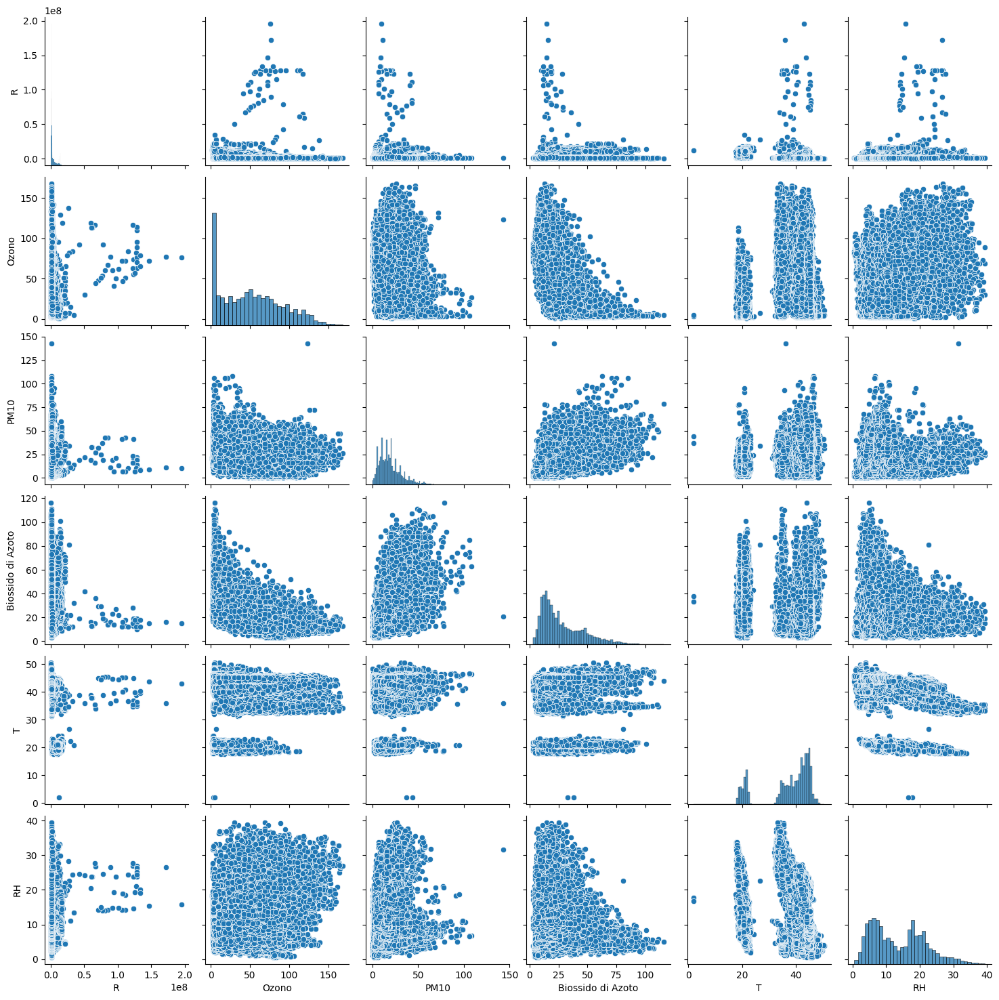

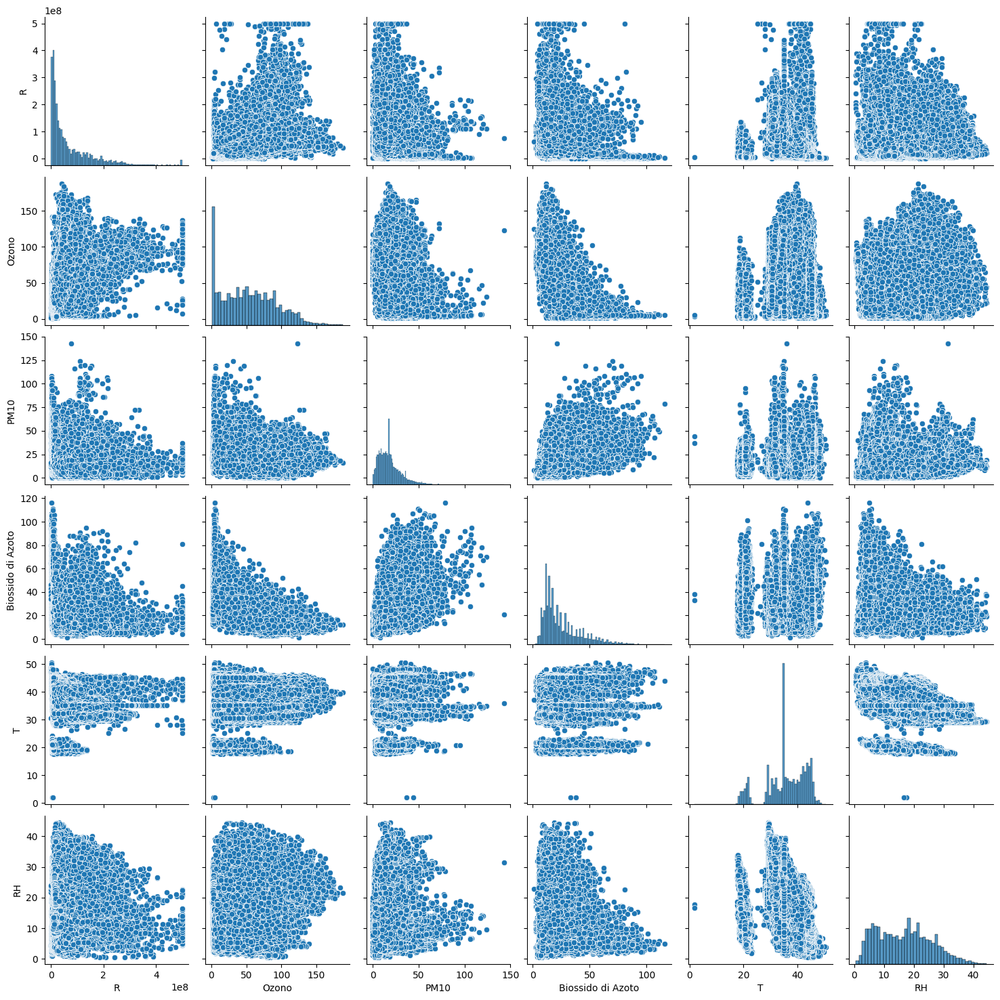

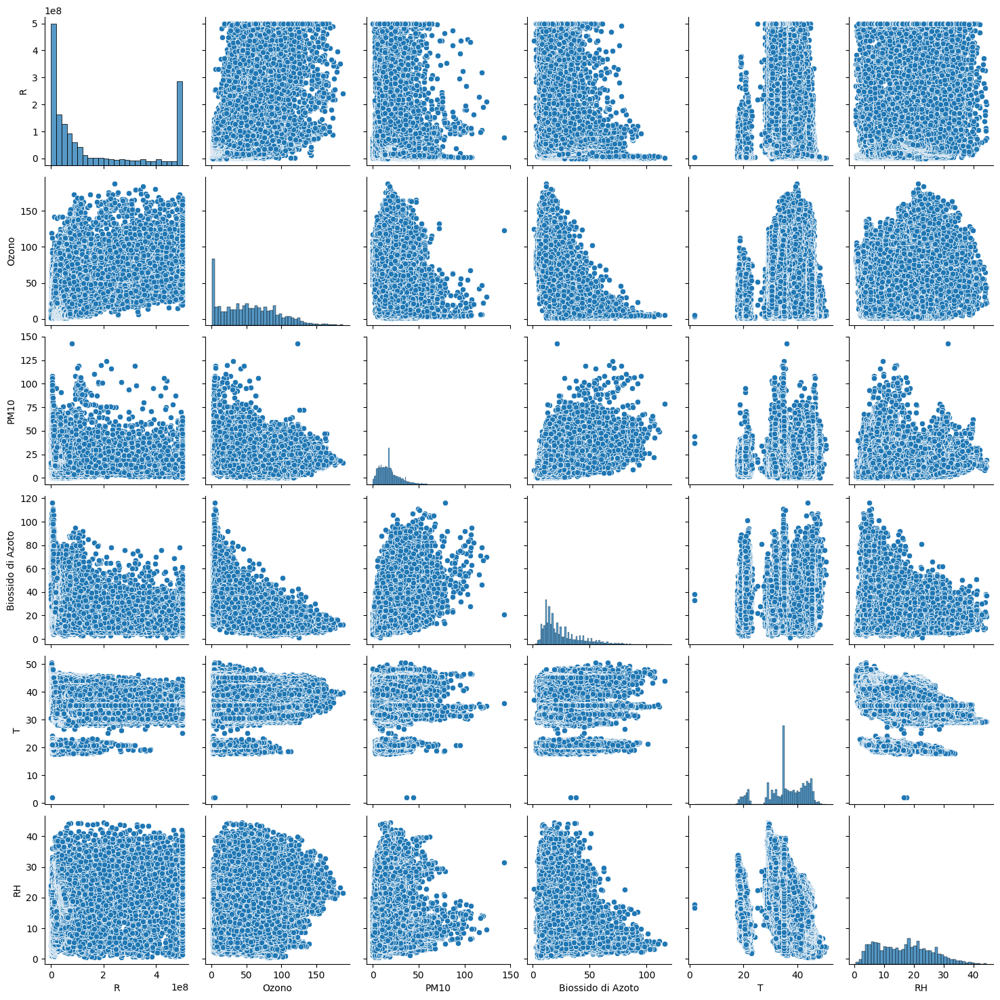

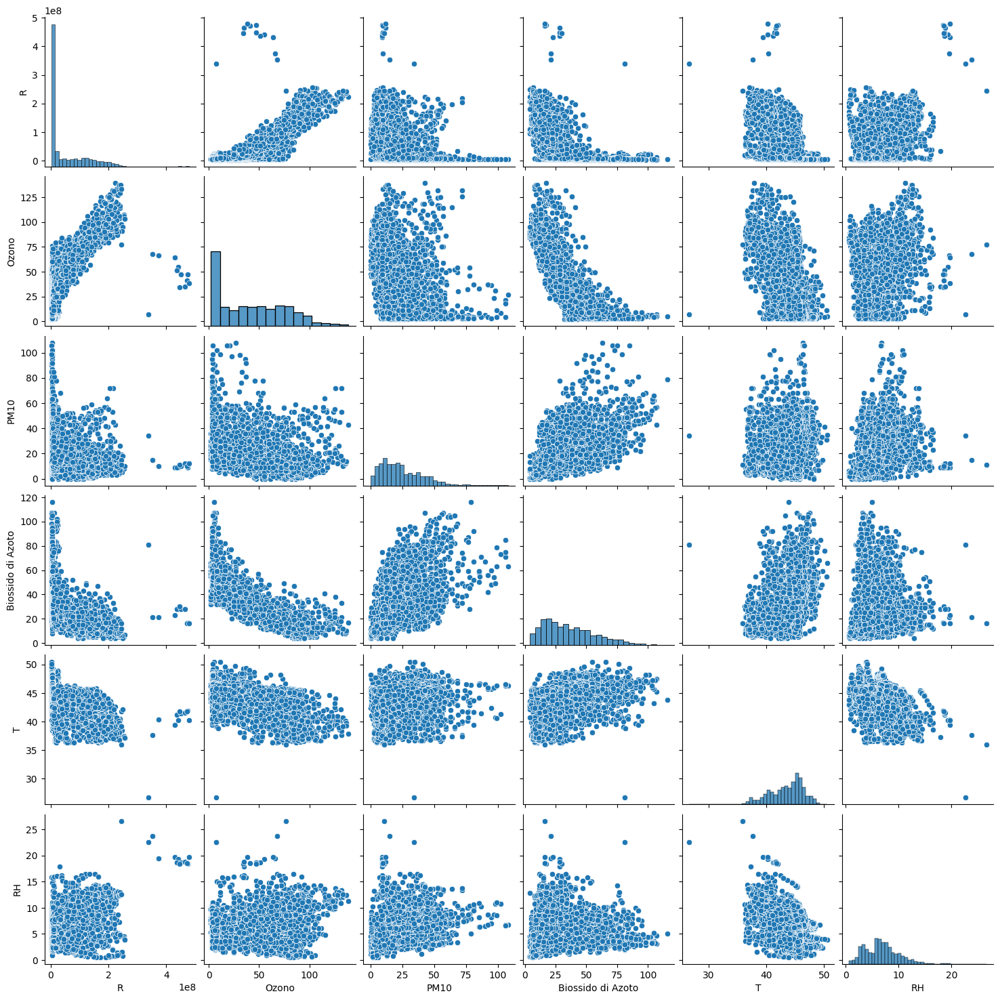

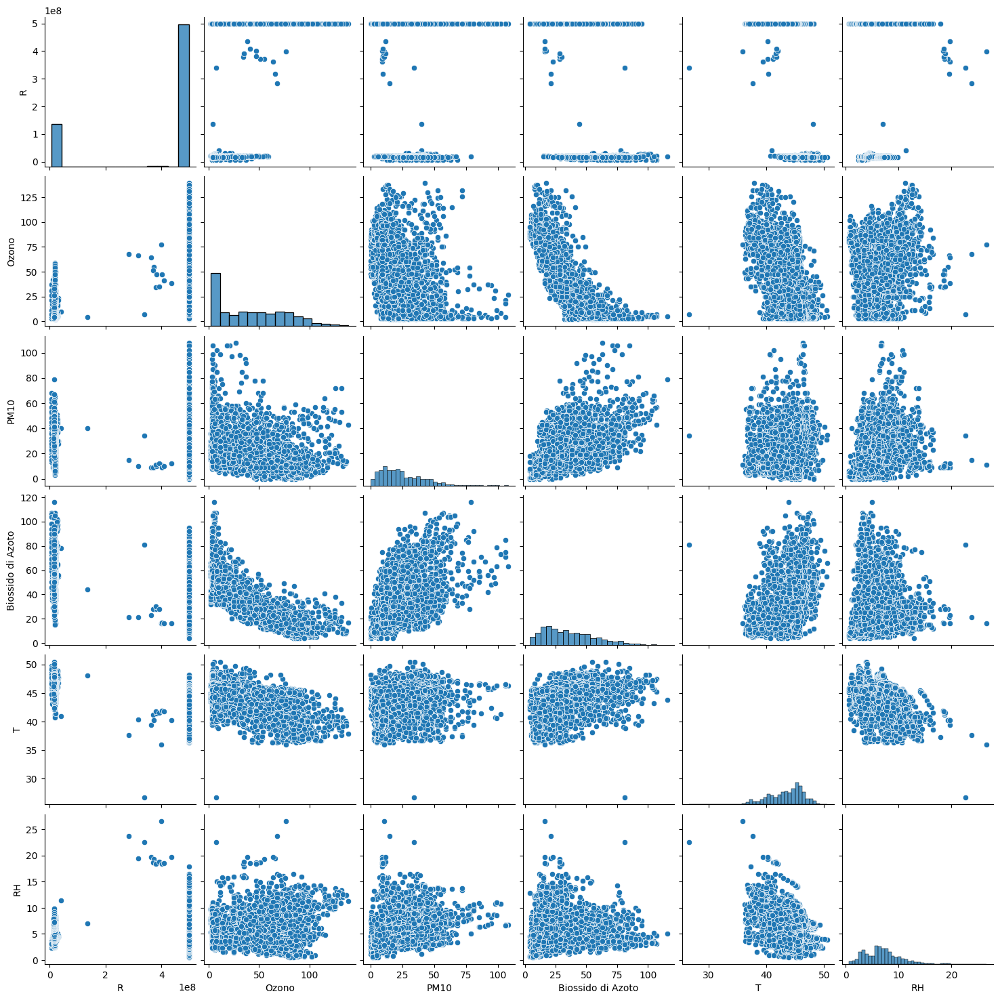

In [21]:
import seaborn as sns
DF = [DF1, DF2, DF3, DF4, DF5, DF6, DF7, DF8]

df_tot.reset_index(inplace = True)

timezone_offset = datetime.timedelta(hours=0)
timezone = datetime.timezone(timezone_offset)
df_tot.ts = df_tot.ts.apply(lambda x: x.replace(tzinfo=timezone))

for i in DF:
    sns.pairplot(df_tot.merge(i.reset_index())[["R","Ozono","PM10", "Biossido di Azoto","T","RH"]])
    plt.show()

In [ ]:
# CHART RH-T (umidity-temperature)
fig,(ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(10,5))
ax1.scatter(
    df_tot["1/13/2021":"1/30/2021"].index,
    df_tot["1/13/2021":"1/30/2021"]["T"]
)
ax1.scatter(
    df_tot["1/13/2021":"1/30/2021"].index,
    df_tot["1/13/2021":"1/30/2021"]["RH"]
)
ax2.scatter(
    df_tot["6/30/2021":"6/30/2022"].RH,
    df_tot["6/30/2021":"6/30/2022"]["T"]
)
ax3.scatter(
    df_tot["6/30/2022":"6/22/2023"].RH,
    df_tot["6/30/2022":"6/22/2023"]["T"]
)